In [1]:
from fuzzywuzzy import fuzz
from fuzzywuzzy import process
import numpy as np
import pandas as pd
import csv

df = pd.read_csv("Amazon_Unlocked_Mobile_without_duplicates.csv")




C:\Users\matth\AppData\Local\Programs\Python\Python38\lib\site-packages\fuzzywuzzy\fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


In [2]:
duplicates = [["Samsung", "samsung", "SAMSUNG", "Samsung Korea LTD"], ["BLU"], ["Apple"], ["LG", "LG Electronics", "LG Electronics MobileComm USA"], ["BlackBerry", "Blackberry"], ["Nokia"], ["Motorola"], ["HTC"], ["CNPGD"], ["Sony", "Sony Ericsson Mobile", "Sony Ericsson"], ["OtterBox"], ["Posh Mobile"], ["Huawei", "HUAWEI"], ["ZTE"], ["Polaroid"], ["Alcatel"], ["Asus", "ASUS Computers", "ASUS"], ["Ultrabox"], ["FIGO"], ["verykool"], ["Lenovo"], ["Casio"], ["RCA"], ["Amazon","Amazon.com, LLC *** KEEP PORules ACTIVE ***"], ["Pantech"], ["Star"], ["Plum"], ["Jitterbug"], ["Microsoft"], ["Padgene"], ["CT-Miami LLC"], ["SKY Devices"], ["Yezz"], ["Sudroid"], ["Turbosight LLD"], ["JoyGeek"]]
brandNames = df["Brand Name"].tolist()
for i in duplicates:
    for j in i:
        if j not in brandNames:
            print("NOT TRUE")

print("Ran")

Ran


In [3]:
undup = []
for i in duplicates:
    undup.append(i[0])
print(undup)

['Samsung', 'BLU', 'Apple', 'LG', 'BlackBerry', 'Nokia', 'Motorola', 'HTC', 'CNPGD', 'Sony', 'OtterBox', 'Posh Mobile', 'Huawei', 'ZTE', 'Polaroid', 'Alcatel', 'Asus', 'Ultrabox', 'FIGO', 'verykool', 'Lenovo', 'Casio', 'RCA', 'Amazon', 'Pantech', 'Star', 'Plum', 'Jitterbug', 'Microsoft', 'Padgene', 'CT-Miami LLC', 'SKY Devices', 'Yezz', 'Sudroid', 'Turbosight LLD', 'JoyGeek']


In [4]:
def replace(brand):
    for a in duplicates:
        for e in a:
            if brand == e:
                return(a[0])
    


temp = df["Brand Name"].tolist()
#print(temp[0:50])
for i in range(len(temp)):
    temp[i] = replace(temp[i])

#print("\n", temp[0:50])

#print("\n", df["Brand Name"].tolist()[0:50])

df["Brand Name"] = temp

In [5]:
rev = df["Reviews"].to_list()
# fuction to return the brand mentioned in the review
def brandFinder(review):
    #review.lower()
    n = 0
    brandFound = []
    for b in undup:
        if b.lower() in review.lower():
            brandFound.append(b)
    brandFoundFinal = []
    for i in brandFound:
        if i not in brandFoundFinal:
            brandFoundFinal.append(i)
    if len(brandFoundFinal) == 1:
        return(brandFoundFinal[0])

In [6]:
# finding the locations of the NaN brands in the list
brandList = df["Brand Name"].to_list()
# saving a list of the reviews to look for the brands 
reviewList = df["Reviews"].to_list()

print("We happy?")
if len(brandList) == len(reviewList):
    print("We happy.")
else:
    print("We not happy.")


# makes a list with all the 
nanLocationList = []
for i in range(len(brandList)):
    if brandList[i] == None:
        nanLocationList.append(i)

print(nanLocationList[0:20])


#print(reviewList[110:115])
#newBrandList = []
print(reviewList[6427])
print(reviewList[6428])
print(reviewList[6429])
z = 0
for l in nanLocationList:
    try:
        print(l, brandFinder(reviewList[l]))
        brandList[l] = brandFinder(reviewList[l])
    except:
        z = 0
df["Brand Name"] = brandList

We happy?
We happy.
[110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129]
Does not support newest or newer iOS. I did not know that when p[purchasing as a replacement for my wife. We are not apple users (this was just the cheapest). She hates it, thus I hate it...
nan
The phone only stays charged for a half hr and then powers down. Super slow I'm very displeased.
110 Star
111 None
112 None
113 None
114 BlackBerry
115 None
116 None
117 None
118 None
119 None
120 None
121 None
122 None
123 None
124 None
125 None
126 None
127 None
128 None
129 None
130 None
131 None
132 None
133 None
134 None
135 None
136 None
137 None
138 None
139 None
140 None
141 None
142 LG
143 None
144 None
145 Star
146 None
147 None
148 None
149 None
150 None
151 None
152 None
153 None
154 None
155 None
156 None
157 None
158 Star
159 None
160 Star
161 None
162 None
163 None
164 None
165 None
166 None
167 None
168 None
169 None
170 None
171 None
172 None
173 None
174 Non

In [7]:
df5 = ((df.value_counts("Brand Name", dropna=False, normalize=False)))# normalize returns percents instead of raw values
pd.set_option("display.max_rows", None, "display.max_columns", None)
print(df5)

Brand Name
Samsung           70947
NaN               66569
BLU               64044
Apple             59329
LG                26346
BlackBerry        18186
Nokia             17160
Motorola          13612
HTC               12896
CNPGD             12615
Sony               8785
OtterBox           8213
Posh Mobile        6769
Huawei             3988
Star               3449
Asus               2605
Amazon             2082
Polaroid           1729
ZTE                1680
Alcatel            1426
Casio              1193
verykool           1156
Lenovo             1043
RCA                 914
Ultrabox            896
Pantech             892
FIGO                883
Jitterbug           628
Microsoft           616
Plum                594
Padgene             509
SKY Devices         453
CT-Miami LLC        445
Yezz                414
JoyGeek             294
Sudroid             252
Turbosight LLD      228
dtype: int64


In [8]:
# bigCompanies and smallCompanies exclude companies that do not manufacture phones and companeies with fewer tahn 500 reviews
bigCompanies = {'Samsung', 'BLU', 'Apple', 'LG', 'BlackBerry', 'Nokia', 'Motorola', 'Posh Mobile', 'HTC', 'ZTE', 'RCA', 'Sony', 'Huawei', 'Asus', 'Amazon', 'Alcatel', 'Casio', 'Lenovo', 'Microsoft'}
smallCompanies = {'CNPGD', 'Polaroid', 'FIGO', 'verykool', 'Pantech', 'Star', 'Plum', 'Jitterbug', 'Padgene'}
allCompanies = {'Samsung', 'BLU', 'Apple', 'LG', 'BlackBerry', 'Nokia', 'Motorola', 'Posh Mobile', 'HTC', 'ZTE', 'RCA', 'Sony', 'Huawei', 'Asus', 'Amazon', 'Alcatel', 'Casio', 'Lenovo', 'Microsoft', 'CNPGD', 'Polaroid', 'FIGO', 'verykool', 'Pantech', 'Star', 'Plum', 'Jitterbug', 'Padgene'}


In [9]:
# puts brand name, price, rating, review, and review votes into lists
brandName = df["Brand Name"].to_list()
price = df["Price"].to_list()
rating = df["Rating"].to_list()
reviews = df["Reviews"].to_list()
reviewVotes = df["Review Votes"].to_list()

# fuction to pop item of specific location from all lists
def multiPop(location):
    brandName.pop(location)
    price.pop(location)
    rating.pop(location)
    reviews.pop(location)
    reviewVotes.pop(location)

# makse a list of locations to pop so indexes dont get screwed up
toPop = []

print(len(brandName))
# itterates through brandName and multiPops brands that are not in allCompanies and NaNs
for brand in range(len(brandName)):
    if brandName[brand] in allCompanies:
        pass
    else:
        toPop.append(brand)

toPop.reverse()
for i in toPop:
    multiPop(i)

# makes empty list for big or small company identifier to go in
size = []

# itterates through brandName and checks if company is big or small and adds big/small to size
print(len(brandName))
for brand in range(len(brandName)):
    if brandName[brand] in bigCompanies:
        size.append("BIG")
    elif brandName[brand] in smallCompanies:
        size.append("SMALL")
    else:
        print("We not happy")
print(len(size))

# makes new dataframe with lists
dff = pd.DataFrame(list(zip(brandName, price, rating, reviews, reviewVotes, size)), columns= ['Brand Name', 'Price', 'Rating', 'Reviews', 'Review Votes', 'Size'])
df.head()
dff.head()

413840
336076
336076


,Brand Name,Price,Rating,Reviews,Review Votes,Size
0,Samsung,199.99,5,I feel so LUCKY to have found this used (phone...,1.0,BIG
1,Samsung,199.99,4,"nice phone, nice up grade from my pantach revu...",0.0,BIG
2,Samsung,199.99,5,Very pleased,0.0,BIG
3,Samsung,199.99,4,It works good but it goes slow sometimes but i...,0.0,BIG
4,Samsung,199.99,4,Great phone to replace my lost phone. The only...,0.0,BIG


In [10]:
print(dff.value_counts("Size", dropna=False, normalize=True), '\n')
print(dff.value_counts("Brand Name", dropna=False, normalize=True))

Size
BIG      0.933185
SMALL    0.066815
dtype: float64 

Brand Name
Samsung        0.211104
BLU            0.190564
Apple          0.176534
LG             0.078393
BlackBerry     0.054113
Nokia          0.051060
Motorola       0.040503
HTC            0.038372
CNPGD          0.037536
Sony           0.026140
Posh Mobile    0.020141
Huawei         0.011866
Star           0.010263
Asus           0.007751
Amazon         0.006195
Polaroid       0.005145
ZTE            0.004999
Alcatel        0.004243
Casio          0.003550
verykool       0.003440
Lenovo         0.003103
RCA            0.002720
Pantech        0.002654
FIGO           0.002627
Jitterbug      0.001869
Microsoft      0.001833
Plum           0.001767
Padgene        0.001515
dtype: float64


In [11]:
#END OF DATA CLEANING!
#END OF DATA CLEANING!
#END OF DATA CLEANING!
#END OF DATA CLEANING!
#END OF DATA CLEANING!

In [12]:
df = df.sample(frac=0.1, random_state = 5)
df.head()

,Product Name,Brand Name,Price,Rating,Reviews,Review Votes
324367,Samsung Galaxy Note 3 N9005 32GB 4G LTE WHITE ...,None,313.05,5,This was a gift and it is loved actually Aweso...,0.0
54699,Apple iPhone 6 a1549 64GB Space Gray Unlocked ...,None,419.99,5,Absolutely LOVE my new iPhone 6! Works perfect!,0.0
51308,Apple iPhone 6 128GB Factory Unlocked GSM 4G L...,None,417.35,5,My phone came in awesome condition. It says th...,2.0
237255,LG Revolution 4G Android Phone (Verizon Wireless),LG,38.95,1,This phone is great until it dies. Everytime t...,2.0
151703,BLU Studio C Super Camera -Unlocked Smartphone...,BLU,99.96,1,Garbage just throw it away waste your money,0.0


In [13]:
df.dropna(inplace=True)
df=df[df['Rating']!=3]

df['Positively Rated'] = np.where(df['Rating']>3,1,0)
df.head(10)

,Product Name,Brand Name,Price,Rating,Reviews,Review Votes,Positively Rated
237255,LG Revolution 4G Android Phone (Verizon Wireless),LG,38.95,1,This phone is great until it dies. Everytime t...,2.0,0
151703,BLU Studio C Super Camera -Unlocked Smartphone...,BLU,99.96,1,Garbage just throw it away waste your money,0.0,0
243852,Moto G Plus (4th Gen.) Unlocked - Black - 64GB...,Motorola,299.00,5,Very Good Phone!!!,1.0,1
11089,Apple iPhone 4S 16GB (Black) - Locked to Sprint,Apple,53.00,5,"even nicer than the rating, works perfect, wil...",0.0,1
71630,"Apple iPhone 6S Plus Unlocked Smartphone, 64 G...",Apple,26.41,1,The phone was sealed in a bag that said 32gb b...,1.0,0
407575,Verizon LG VX10000 Voyager with Touch Screen &...,LG,14.44,5,Nice,0.0,1
153134,"BLU Studio M HD 16GB - 5.0"" Smartphone -US GSM...",BLU,79.99,1,I have purchased other Blu phones in the past ...,0.0,0
21235,Apple iPhone 5 64GB (White) - Verizon Wireless,Apple,139.95,5,"I already had an iphone 4, so I change it for ...",2.0,1
292243,Polaroid A1BK Unlocked Phone Dual SIM GSM With...,Polaroid,29.30,1,This product has been very hard for my son to ...,0.0,0
294610,Posh Mobile Icon S510-B GSM Unlocked 4G HSDPA+...,Posh Mobile,68.00,1,Phone wont even turn on.?,0.0,0


[Text(0, 0.5, 'Rating 5'),
 Text(0.5, 0, 'Rating 4'),
 Text(0.5, 1.0, 'Rating 4 vs Rating 5')]

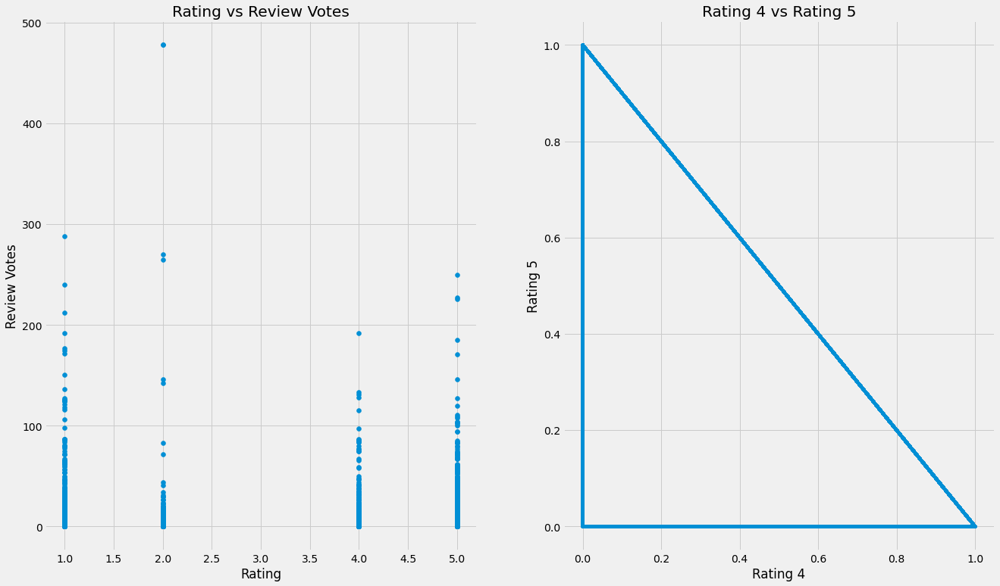

In [14]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')

fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, figsize = (20,12))
ax0.scatter(df['Rating'],df['Review Votes'])
ax0.set(title= 'Rating vs Review Votes', xlabel = 'Rating', ylabel = 'Review Votes')
ax1.plot(df['Rating']==4, df['Rating']==5)
ax1.set(title='Rating 4 vs Rating 5', xlabel='Rating 4', ylabel='Rating 5');


In [15]:
df['Positively Rated'].mean()

0.7483749349973999

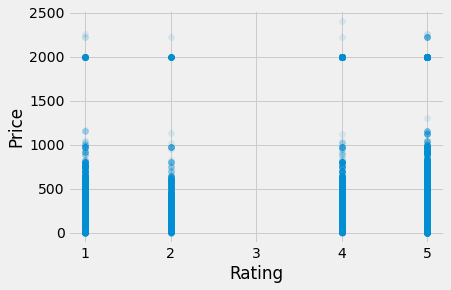

In [16]:
ylabel = df['Price']
plt.ylabel("Price")
plt.xlabel("Rating")
xlabel = df["Rating"]
plt.scatter(xlabel, ylabel, alpha =0.1)
plt.show()

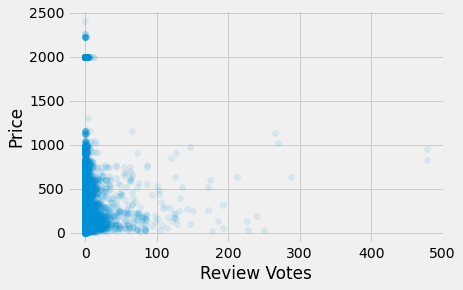

In [17]:
ylabel2 = df["Price"]
plt.ylabel("Price")
xlabel2=df["Review Votes"]
plt.xlabel("Review Votes")
plt.scatter(xlabel2, ylabel2, alpha=0.1)
plt.show()

In [18]:
from sklearn.model_selection import train_test_split
X = df['Reviews']
y = df['Positively Rated']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 0)
print('X_train first entry:\n', X_train.iloc[0])
print('\nX_train shape', X_train.shape)

df['Positively Rated'].value_counts()

X_train first entry:
 Great customer service. Couldn't ask for better.

X_train shape (23076,)


1    23026
0     7742
Name: Positively Rated, dtype: int64

In [19]:
from sklearn.feature_extraction.text import CountVectorizer
vect = CountVectorizer()
vect.fit(X_train)

vect.get_feature_names()[::2000]

['00',
 'around',
 'cobalt',
 'drowned',
 'glitching',
 'l9',
 'ocasionando',
 'reachable',
 'smoothest',
 'twisted']

In [20]:
len(vect.get_feature_names())

19603

In [21]:
X_train_vectorized = vect.transform(X_train)
X_train_vectorized

<23076x19603 sparse matrix of type '<class 'numpy.int64'>'
	with 617066 stored elements in Compressed Sparse Row format>

In [22]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(X_train_vectorized, y_train)

C:\Users\matth\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [23]:
from sklearn.metrics import roc_auc_score, roc_curve

predictions = model.predict(vect.transform(X_test))
print('AUC: ', roc_auc_score(y_test,predictions))

AUC:  0.8971218058922535


In [24]:
feature_names = np.array(vect.get_feature_names())
# ^above... gets feature names as np (numpy) array
# sorts coefficient from model
sorted_coef_index =model.coef_[0].argsort()

print('Smallest Coefficient (Negative reviews): \n{}\n'.format(feature_names[sorted_coef_index[:10]]))
print('Largest Coefficient (Positive reviews): \n{}'.format(feature_names[sorted_coef_index[:-11:-1]]))

Smallest Coefficient (Negative reviews): 
['horrible' 'worst' 'junk' 'useless' 'return' 'waste' 'annoying' 'dies'
 'disappointing' 'freezes']

Largest Coefficient (Positive reviews): 
['excellent' 'excelente' 'excelent' 'perfect' 'awesome' 'love' 'amazing'
 'great' 'perfectly' 'loves']


In [25]:
print(model.predict(vect.transform(['This is a terrible phone, barely turns on, bad battery', 'Been great, have used for over two years, never had a problem. 10/10', 'constatnly drops connection, a bit overpriced, looking for a new phone soon','love it!'])))

[0 1 0 1]
